# Creating vector plot using Julia

[based on stackoverflow question](https://stackoverflow.com/questions/52360705/how-can-i-plot-vector-field-on-julia)

## Packages

The [Plots.jl](https://github.com/JuliaPlots/Plots.jl) package will allow us to create plots using various [backends](https://docs.juliaplots.org/latest/backends/#backends)

There are many backends available for plotting, such as
- gr() (default backend good for creating fast plots)
- plotly() (good for interactive plots)
- pyplot() (a highly customizable python library for plotting)

Here we use the plotly backend to create the plot. 

In [1]:
using Plots;

The SpecialFunctions is a package containinng many special mathematical functions listed [here](https://github.com/JuliaMath/SpecialFunctions.jl/blob/master/README.md)

In [2]:
using SpecialFunctions;

## [Sample plot based on stack exchange question](https://stackoverflow.com/questions/52360705/how-can-i-plot-vector-field-on-julia)

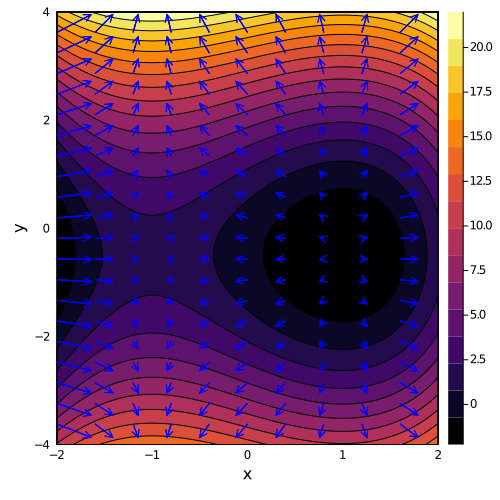

In [3]:
# plotted using gr() backend
gr(size=(500,500))
# create sample points along x and y directions
X = range(-2, stop=2, length=100)
Y = range(-4, stop=4, length=100)
# the function to be plotted
f(x, y) = x^3 - 3x + y^2+y
# here we create the contour plot
# (without the vectors)
contour(X, Y, f,fill=true)
# number of vector points
# in the x and y direction
nqx=11
nqy=22
# again create sample points in x and y direction
x = range(-2, stop=2, length=nqx)
y = range(-4, stop=4, length=nqy)
# the gradient of the function used in the contour
# here we divide by 25 to adjust the magnitude of the
# vectors
df(x, y) = [3x^2 - 3; 2y+1] / 25
# quiver! is used to place the vectors at each
# samplepoint x and y
quiver!(repeat(x,nqx), vec(repeat(y',nqy)), quiver=df, c=:blue)

xlims!(-2, 2)
ylims!(-4, 4)
plot!(xlab="x", ylab="y")

## [Sample Plot Similar to one found in PlotlyJS Documentation](http://juliaplots.org/PlotlyJS.jl/stable/examples/contour/)

### We recreate plot plot done in PlotlyJS using gr() to show different approaches

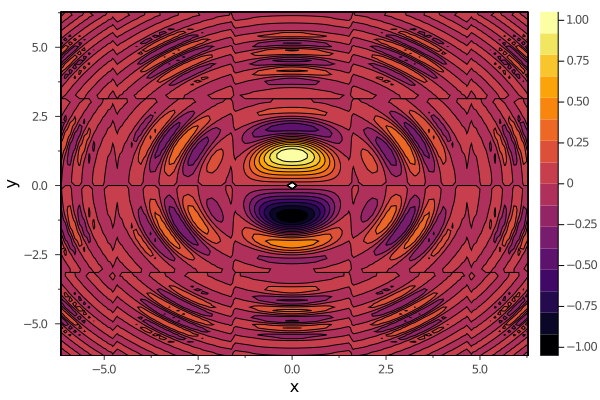

In [4]:
theme(:ggplot2)
gr(size=(600,400)) 
# create sample points along x and y directions
# This time we create the points using a for loop
# so that we can set different values for each point
x = [-2*pi + 4*pi*i/100 for i in 1:100]
y = [-2*pi + 4*pi*i/100 for i in 1:100]
f(x, y) = sin(y) * cos(x) * sin(x*x+y*y)/log(x*x+y*y+1)
contour(x, y, f,fill=true)
plot!(xlab="x", ylab="y")

## Plotting the same function using two different methods

### Plot $\cos{x}\sin{y}$ as a 2d contour plot and an interactive 3d plot

In [5]:
using Plots;
theme(:dark)
gr(size=(600,600));
x=range(-2*pi, stop=2*pi, length=250);
y=range(-2*pi, stop=2*pi, length=250);

In [6]:
# create 2 nxn arrays of points to sample from
xx = reshape([xi for xi in x for yj in y],  length(y), length(x));
yy = reshape([yj for xi in x for yj in y],  length(y), length(x));

now pass the sample falues to the funtion
- Note that the .(x) notation is called broadcasting and it is used to indicate to Julia that the function sin has to be computed for each element of x
- Where code written in Python and Matlab will see drastic improvements in speed from vectorizing code. This is not necessary in Julia. This is because Python and Matlab are writen in C so vectorizing code will reduce the amount of time spent passing code to the lower level language. But Julia is written in Julia (similar to how C is written in C) so vectorization is not neccessary.
- sin.(xx) can be thought of as mapping the sin function onto all of the values in the array xx

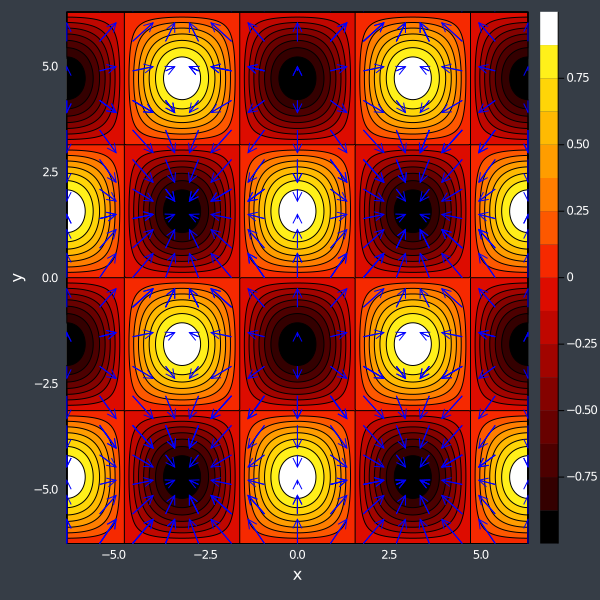

In [7]:
f(x,y)=cos.(x).*sin.(y);
contour(x,y,f,fill=true)
nqx=15
nqy=19
x = range(-2*pi, stop=2*pi, length=nqx)
y = range(-2*pi, stop=2*pi, length=nqy)
df(x, y) = [sin(x);cos(y)]/1.75
quiver!(repeat(x,nqx), vec(repeat(y',nqy)), quiver=df, c=:blue)

xlims!(-2*pi, 2*pi)
ylims!(-2*pi, 2*pi)
plot!(xlab="x", ylab="y")

### Plot $\cos{x}\sin{y}$ as a 2d contour plot and an interactive 3d plot

Here we switch from using gr() to using plotly. This is to demonstrate plotly's ability to make 3d interactive plots

This makes them extremely easy to add plots to a website using simple html code

```<iframe width="100%" height="450px" frameborder="0" scrolling="no" src="/foo/bar/sincos.html"></iframe>```


In [8]:
plotly();
theme(:dark)

In [9]:
zz = cos.(xx).*sin.(yy);
plot3d(xx,yy,zz, label=:none, st = :surface)
plot!(xlab="x", ylab="y", zlab="cos(x)*sin(y)")

<!DOCTYPE html>
 
 
 Plots.jl

### Creating Plots using special functions

- Here we plot the zeta function (from the specialfunctions pacage) on the complex plane

In [10]:
x=range(-1, stop=2, length=100)
y=range(-20, stop=20, length=100)
xx = reshape([xi for xi in x for yj in y],  length(y), length(x));
yy = reshape([yj for xi in x for yj in y],  length(y), length(x));
# We again use broadcasting (as explained above)
# We first broadcast the built in function complex across
# the x/y coordinates creating a complex number with the
# x representing the real numbers and the y the imaginary
# We then broadcast the zeta function across this array
# and finally the aboslute value
zz=abs.(zeta.(complex.(xx,yy)))

plot3d(xx,yy,zz,
    label=:none,
    st = :surface,
    xlim = (-1, 2),
    ylim = (-20, 20),
    zlim = (0, 5),
    xlab = "Real", 
    ylab = "Imaginary", 
    zlabel = "Zeta",
    size=(640, 480),
    autosize = false,
    width= 500,
    height = 250,
    c=cgrad([:orange, :blue], [0.0125, 0.025, 0.05,0.1],scale=:exp))

<!DOCTYPE html>
 
 
 Plots.jl

In [16]:
theme(:dao)
plotly(size=(600,600));
x=range(-1, stop=2, length=100)
y=range(-20, stop=20, length=100)
f(x,y)=abs.(zeta.(complex.(x,y)));
data=contour(x,y,f,fill=true)
plot(data,
    xlab = "Real", 
    ylab = "Imaginary",
    xlim = (-1, 1),
    ylim = (-20, 20),
    title="the zeta function",
    zlim = (0, 5))

<!DOCTYPE html>
 
 
 Plots.jl